In [9]:
#Imports que necesitaremos
import numpy as np
import matplotlib.pyplot as plt
import sisl
import sisl.viz
import ase
from ase.build import molecule

In [18]:
#Primero hay que generar los archivos de input, necesitaremos pseudopotenciales de H y C junto al fdf del benzeno, los pseudopotenciales
#los descargamos, y el fdf lo generamos con ase
benzene = ase.build.molecule("C6H6",5)
sisl.Geometry.new(benzene).write("benzene.fdf")
#Al archivo fdf es importante añadir TS.HS.Save true para guardar el Hamiltoniano, con eso ya podremos simular con Siesta y leemos el archivo resultado
H = sisl.get_sile("/home/samba/homes/convidat/Baixades//benzene.fdf").read_hamiltonian()
def LDOS_grid (H,V):
    #Obtenemos las energias y la geometria
    eigen = H.eigenstate()
    Geometry = H.geometry
    #Creamos los grids que necesitamos 
    gridA = sisl.Grid((100,100,100),geometry = Geometry) #Grid de 100x100x100 que lo utilizaremos para guardar los DOS temporales
    gridB = sisl.Grid((100,100,100), geometry = Geometry) #Grid donde finalmente estaran los LDOS
    #Integrar sobre la energia para calcular LDOS
    if V > 0: #Integral de la parte positiva
        for eig in eigen:
            if 0 < eig.eig <= V:#Integrar sobre la energia para calcular LDOS
                gridA.fill(0) #El gridA se convierte todo en 0, lo usaremos para reiniciar el grid en cada loop
                eig.wavefunction(gridA) #El gridA se llenará de las funciones de onda
                DOS = np.abs((gridA*gridA)) #Calculo de la densidad de estados (psi* · psi)
                gridB += DOS #El resultado de la densidad de estados se sumara al grid donde esta los LDOS
    
    elif V < 0: #Integral de la parte negativa
        for eig in eigen:
            if V <= eig.eig < 0:  # Para todos los estados con energía mayor a V y menor que 0
                gridA.fill(0) #El gridA se convierte todo en 0, lo usaremos para reiniciar el grid en cada loop
                eig.wavefunction(gridA) #El gridA se llenará de las funciones de onda
                DOS = np.abs((gridA*gridA)) #Calculo de la densidad de estados (psi* · psi)
                gridB += DOS #El resultado de la densidad de estados se sumara al grid donde esta los LDOS
    return gridB

In [ ]:
#Para representar las imagenes STM necesitaremos la helper function, lo unico que cambiamos es poner LDOS_grid en z_0

In [16]:
# The helper function
def plot_STM_images(
    LDOS_grid: sisl.Grid, 
    min_height: int = 0, 
    max_height: int = 2,
    steps: int = 9,
    crange = None,
    colorscale: str = None
):
    """Plots constant height STM images at multiple heights

    Parameters
    ----------
    LDOS_grid:
        A grid containing the LDOS corresponding to the voltage that you
        want to plot, for ALL SPACE.
    min_height:
        The height of the first image.
    max_height:
        The height of the last image.
    steps:
        The number of steps between the first and the last image.
    log:
        Whether to plot the log of the values.
    crange:
        The range of the colorscale. E.g. [0, 2]. If None, it is computed
        from the minimum and maximum values of the data.
    colorscale:
        The plotly colorscale to use.

    Examples
    ----------

    This function should be used like:
    >>> grid = ...compute the LDOS in the grid.
    >>> plot_STM_images(grid)
    """
    
    
    # Determine all the heights that the user wants to plot
    heights = np.linspace(min_height, max_height, steps)
    # Get the position of the benzene molecule
    z_0 = LDOS_grid.geometry.xyz[:, 2].max()
    
    # Initialize a list of plots
    plots = []
    coloraxes = []
    # Loop through the heights, and for each of them we will create a plot.
    for height in heights:
        # Get the z for which we want the LDOS (benzene position + height)
        z = z_0 + height
        
        # Get the plot for this height
        plot = LDOS_grid.plot(axes="xy", z_range=[z - 0.1, z + 0.1], crange=crange, colorscale=colorscale)

        # And append it to the list
        plots.append(plot)

    # Merge all the plots, with some extra arguments to beautify the plot.
    return sisl.viz.merge_plots(
        *plots, 
        composite_method="subplots", 
        arrange="square", 
        subplot_titles=[f"Height = {height} Ang" for height in heights],
        horizontal_spacing=0,
        vertical_spacing=0.05
    ).update_xaxes(
        visible=False
    ).update_yaxes(
        visible=False
    ).update_layout(
        height=900, title=f"Constant height STM images",
    )

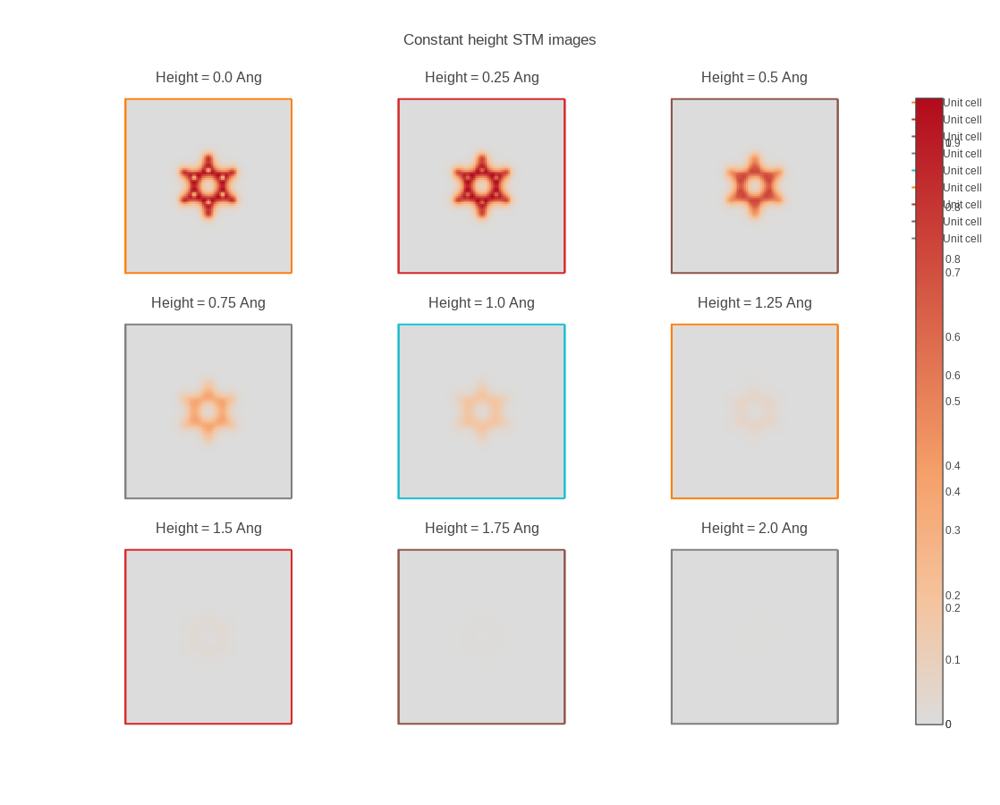

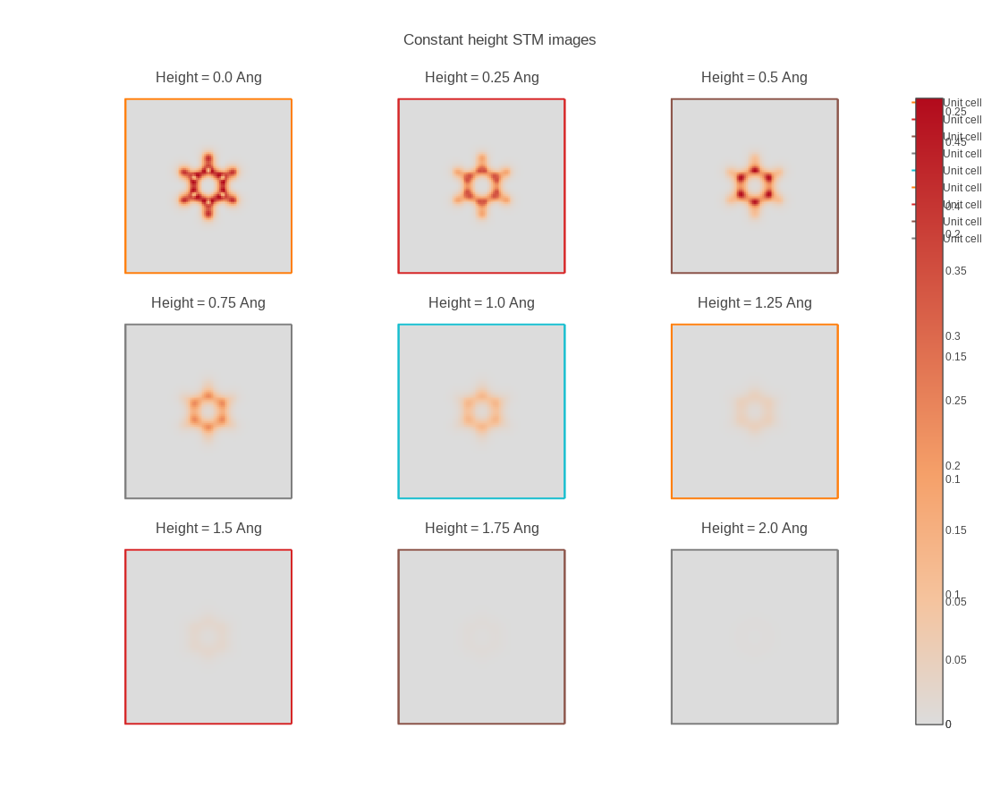

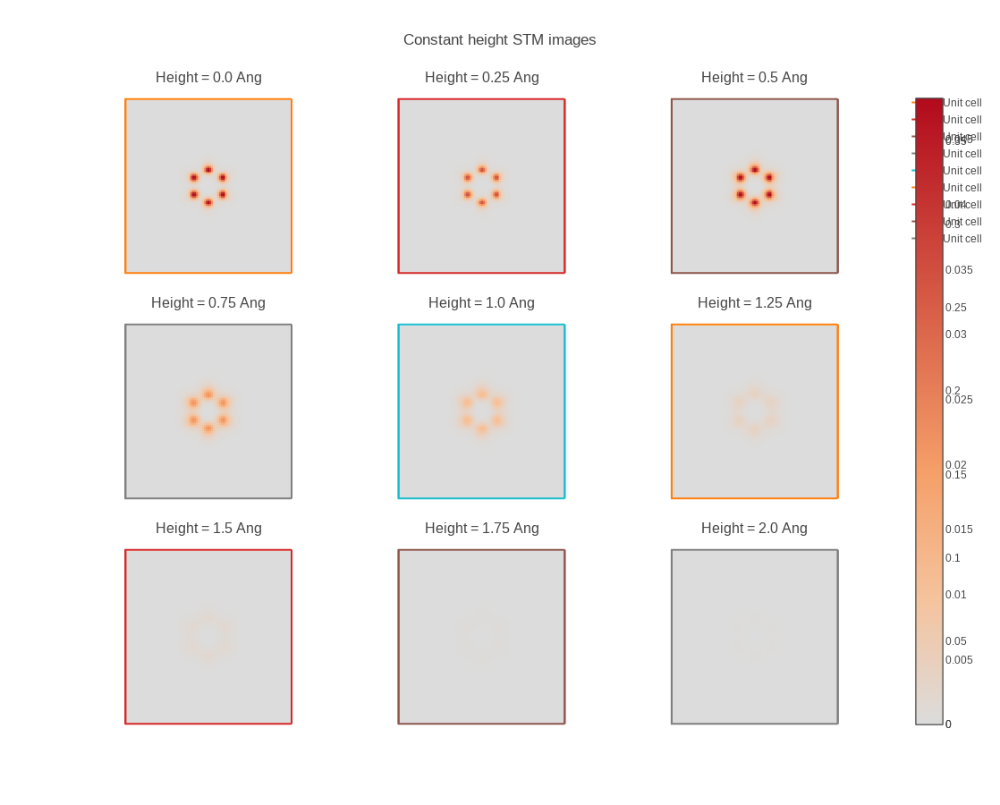

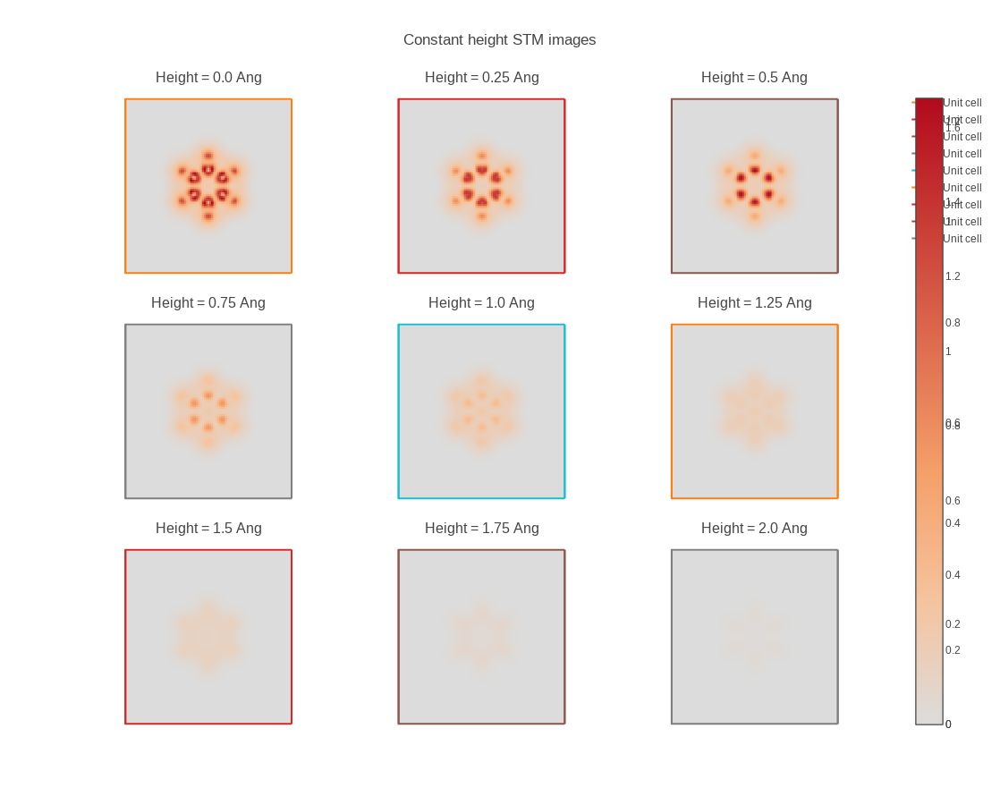

In [23]:
#Para hacer el plot de las imagenes tendremos que usar plot_STM_images(LDOS_grid(H,V)).show(), donde V será el voltaje que queramos aplicar
plot_STM_images(LDOS_grid(H,-20)).show()
plot_STM_images(LDOS_grid(H,-5)).show()
plot_STM_images(LDOS_grid(H,5)).show()
plot_STM_images(LDOS_grid(H,+20)).show()

In [ ]:
#Viendo los plot, podemos ver que el +20 muestra la inversa de la imagen de -20, para +5 y -5 pasa lo mismo,
#eso es debido dependiendo de si la la corriente va de la punta a la muestra o de la muestra a la punta
#También vemos que a mayor voltaje, mayor intensidad.

In [25]:
import plotly.io as pio
pio.renderers.default = "notebook"